In [1]:
import pandas as pd
from pathlib import Path
import numpy as np
from collections import Counter
import collections

from mscrape import MITREWebscraper
from feature_extraction import *
from data_cleaning import *
import plotly.graph_objs as go

import operator
import gensim
import gensim.corpora as corpora
from gensim.corpora.dictionary import Dictionary
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
#Importing visualization packages
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pyLDAvis
import pyLDAvis.gensim
from sklearn.cluster import KMeans
import pke
import string
from nltk.corpus import stopwords

%matplotlib inline

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/user/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


/anaconda3/lib/python3.7/site-packages/thinc/neural/train.py:7: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working

/anaconda3/lib/python3.7/site-packages/thinc/check.py:4: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working

/anaconda3/lib/python3.7/site-packages/networkx/classes/reportviews.py:95: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working



# Load Data

In [2]:
data = MITREWebscraper()

all_files = [pth for pth in Path().glob("description/*.txt") if pth.is_file()]

tech_df = pd.read_csv('tech_tactic.csv', index_col=0)

# Data Processing

## Data Cleaning

Data cleaning is the process of preparing data for analysis by removing or modifying data that is incorrect, incomplete, irrelevant, duplicated, or improperly formatted. This data is usually not necessary or helpful when it comes to analyzing data because it may hinder the process or provide inaccurate results. 

The 3 main methods we used were:
     - Removing stop words and punctuation
     - Removing non-noun words
     - Converting everything to lower case
     
#### Removing Stop words

A stop word is a commonly used word (such as "the") that a search engine has been programmed to ignore.

Example:

'This is a sample sentence, showing off the stop words filtration.'

'sample sentence showing stop words filtration'

In [3]:
data_clean = DataCleaning()

word_list = data_clean.CorpusListWords(tech_df['Technique_description'])
phrase_list = data_clean.CorpusListPhrase(tech_df['Technique_description'], stopwords.words('english'))

tech_df['Description corpus'] = pd.Series(phrase_list)
tech_df['Description corpus'] = tech_df['Description corpus'].str.split(',')
tech_df['Corpus length'] = tech_df['Description corpus'].str.len()

tech_df['Word_list'] = pd.DataFrame(word_list)
tech_df['Phrase_list'] = pd.DataFrame(phrase_list)

# Data Visualization/Exploration

Data visualization is the graphical representation of information and data. By using visual elements like charts, graphs, and maps, data visualization tools provide an accessible way to see and understand trends, outliers, and patterns in data.

In the world of Big Data, data visualization tools and technologies are essential to analyze massive amounts of information and make data-driven decisions.

In [4]:
init_notebook_mode()

trace0 = Histogram(
    x=tech_df['Corpus length'],
    marker=dict(
        color='#EB89B5',
    ),
    opacity=0.75
)
data = [trace0]
layout = Layout(
    showlegend=False,
    height=600,
    width=600,
    title='Histogram of Number of Phrases per Technique'
)

fig = dict( data=data, layout=layout )

iplot(fig)


In [5]:
def splitDataFrameList(df,target_column,separator):
    ''' df = dataframe to split,
    target_column = the column containing the values to split
    separator = the symbol used to perform the split
    returns: a dataframe with each entry for the target column separated, with each element moved into a new row. 
    The values in the other columns are duplicated across the newly divided rows.
    '''
    def splitListToRows(row,row_accumulator,target_column,separator):
        split_row = row[target_column].split(separator)
        for s in split_row:
            new_row = row.to_dict()
            new_row[target_column] = s
            row_accumulator.append(new_row)
    new_rows = []
    df.apply(splitListToRows,axis=1,args = (new_rows,target_column,separator))
    new_df = pd.DataFrame(new_rows)
    return new_df
tactic_tally = pd.DataFrame(splitDataFrameList(tech_df,'Tactic_name', ',').groupby(['Tactic_name'])['Technique_number'].count()).reset_index()


trace1 = Pie(
    labels=tactic_tally['Tactic_name'].tolist(),
    values=tactic_tally['Technique_number'].tolist(),
)
data = [trace1]
layout = Layout(
    showlegend=True,
    height=600,
    width=600,
    title='Breakdown of TTP Database Techniques by Tactic'
)

fig = dict( data=data, layout=layout )

iplot(fig)

In [6]:
flat_list = []
corpus = []
for sublist in word_list:
    corpus.append(sublist.split(','))
for sublist in corpus:
    for i in sublist:
        flat_list.append(i)

monogram = []
monogram_freq = []

for i in Counter(flat_list).most_common(50):
    monogram.append(i[0])
    monogram_freq.append(i[1])

trace2 = Bar(
    x=monogram,
    y=monogram_freq,
    marker=dict(
        color='#EB89B5',
    ),
    opacity=0.75
)
data = [trace2]
layout = Layout(
    showlegend=True,
    height=600,
    width=1200,
    title='50 Most Frequent Noun Phrases in Dataset',
    xaxis={'title':'Noun Phrases', 'automargin':True},
    yaxis={'title':'Frequency in Corpus'}
)

fig = dict( data=data, layout=layout )

iplot(fig) 

In [7]:
flat_list = []
for sublist in tech_df['Description corpus'].tolist():
    for i in sublist:
        flat_list.append(i)

phrase = []
phrase_freq = []
for i in Counter(flat_list).most_common(50):
    phrase.append(i[0])
    phrase_freq.append(i[1])

trace3 = Bar(
    x=phrase,
    y=phrase_freq,
    marker=dict(
       color='#EB89B5',
    ),
    opacity=0.75
)
data = [trace3]
layout = Layout(
    showlegend=True,
    height=600,
    width=1200,
    title='50 Most Frequent Phrases in Dataset',
    xaxis={'title':'Phrases', 'automargin':True},
    yaxis={'title':'Frequency in Corpus'}
)

fig = dict( data=data, layout=layout )

iplot(fig)

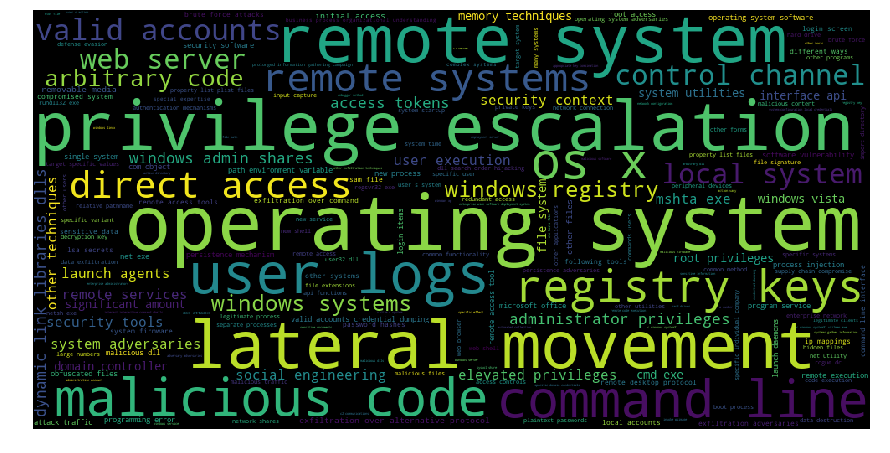

In [8]:
word_cloud_dict=Counter(flat_list)
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(word_cloud_dict)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [9]:
top20phrase= []
top20phrase_freq = []
for i in Counter(flat_list).most_common(20):
    top20phrase.append(i[0])
    top20phrase_freq.append(i[1])

list_col = 'Description corpus'
tech_df2 = tech_df
#tech_df2['Description corpus'] = tech_df2['Description corpus'].str.split(',')
tech_df2 = pd.DataFrame({
      col:np.repeat(tech_df2[col].values, tech_df2[list_col].str.len())
      for col in tech_df2.columns.drop(list_col)}
    ).assign(**{list_col:np.concatenate(tech_df2[list_col].values)})[tech_df2.columns]

phrase_per_tactic = splitDataFrameList(tech_df2.merge(pd.DataFrame({'Description corpus':top20phrase}), how='inner', on='Description corpus'),'Tactic_name', ',')
phrase_per_tactic['Counts'] = phrase_per_tactic.groupby(['Tactic_name', 'Description corpus'])['Description corpus'].transform('count')
phrase_per_tactic = phrase_per_tactic.drop(['Technique_name', 'Technique_number'], axis=1).drop_duplicates()

trace4 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='DefenseEvasion']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='DefenseEvasion']['Description corpus'].tolist(),
    name='DefenseEvasion'
)

trace5 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Persistence']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Persistence']['Description corpus'].tolist(),
    name='Persistence'
)

trace6 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Execution']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Execution']['Description corpus'].tolist(),
    name='Execution'
)

trace7 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='PrivilegeEscalation']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='PrivilegeEscalation']['Description corpus'].tolist(),
    name='PrivilegeEscalation'
)

trace8 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='CommandAndControl']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='CommandAndControl']['Description corpus'].tolist(),
    name='CommandAndControl'
)

trace9 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Discovery']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Discovery']['Description corpus'].tolist(),
    name='Discovery'
)

trace10 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='CredentialAccess']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='CredentialAccess']['Description corpus'].tolist(),
    name='CredentialAccess'
)

trace11 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='LateralMovement']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='LateralMovement']['Description corpus'].tolist(),
    name='LateralMovement'
)

trace12 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Impact']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Impact']['Description corpus'].tolist(),
    name='Impact'
)

trace13 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Collection']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Collection']['Description corpus'].tolist(),
    name='Collection'
)

trace14 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='InitialAccess']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='InitialAccess']['Description corpus'].tolist(),
    name='InitialAccess'
)

trace15 = Bar(
    y=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Exfiltration']['Counts'].tolist(),
    x=phrase_per_tactic.loc[phrase_per_tactic['Tactic_name']=='Exfiltration']['Description corpus'].tolist(),
    name='Exfiltration'
)

data =[trace4, trace5, trace6, trace7, trace8, trace9, trace10, trace11, trace12, trace13, trace14, trace15]

layout = Layout(
    showlegend=True, height=400,width=1000,title='20 Most Frequent Phrases by Tactic',
    xaxis={'title':'Phrases by Tactic', 'automargin':True},yaxis={'title':'Frequency in Corpus'},barmode='stack'
)

fig = dict( data=data, layout=layout )
iplot(fig)

## Feature Extraction

Feature extraction starts from an initial set of data and builds derived values (features) intended to be informative and non-redundant to be inputted into models.

The feature extraction techniques we have developed thus far are:

- Bag of Words
- TF-IDF
- Word2Vec
- Doc2Vec

Example:

Bag of Words: Gathers all the unique words in a document list and for each document, tells you how many times each word appears.

TF-IDF: tf–idf or TFIDF, short for term frequency–inverse document frequency, is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus. Higher is better, relative to other words.

Word2Vec: Word2vec is a two-layer neural net that processes text. Its input is a text corpus and its output is a set of vectors: feature vectors for words in that corpus. It uses transitional probabilities between those states: the likelihood that words will co-occur. The purpose and usefulness of Word2vec is to group the vectors of similar words together in vectorspace. That is, it detects similarities mathematically.

Doc2Vec: Word2Vec but for sentences and paragraphs.


In [10]:
feature = FeatureSelection()
tfidf_matrix = feature.tfidfTransformation(word_list)
bow_matrix = feature.BoWTransformation(word_list)
doc2vec_matrix=feature.Doc2Vec(word_list)

# Models

# Baseline (No Machine Learning): 

__<u>The baseline method involves creating a tag list from the most frequent phrases in the corpus.</u>__

__<u>Key Steps</u>__
    * Obtain n most frequently occurring phrases in the corpus
    * Match phrases to technique descriptions where they occur

In [11]:
# Flattening corpus list to identify most common phrases & tokens
flatlist =[]
for sublist in tech_df['Description corpus']:
    for i in sublist:
        flatlist.append(i)

In [12]:
top_200 = Counter(flatlist).most_common(200)
tag_list = []
for word in top_200:
    tag_list.append(word[0])
    
tag_list = pd.DataFrame({'Tags': tag_list})
list_col = 'Description corpus'
tech_df2 = tech_df
tech_df2 = pd.DataFrame({
      col:np.repeat(tech_df2[col].values, tech_df2[list_col].str.len())
      for col in tech_df2.columns.drop(list_col)}
    ).assign(**{list_col:np.concatenate(tech_df2[list_col].values)})[tech_df2.columns]

# Technique-to-Tag table
tag_assignment = tech_df2.merge(tag_list, left_on='Description corpus', right_on='Tags', how='inner').drop_duplicates()
tag_assignment = tag_assignment.drop(['Description corpus', 'Tactic_name'], axis=1)
tag_assignment = tag_assignment.reset_index(drop=True)

# Tag-to-Technique Table
tag_assignment_alt = tag_assignment.drop(['Technique_number'],axis=1)
tag_assignment_alt = pd.DataFrame(tag_assignment_alt.groupby(['Tags'])['Technique_name'].apply(list)).reset_index()

pd.DataFrame.from_dict({'Statistic':['# of Unique Techniques Tagged',
                                     'Total # of Tags applied',
                                     'Average # of Tags per Technique',
                                     'Average # of Tags per Tagged Technique',
                                     '# of Tags with >1 Technique'],
                        'Value':[str(tag_assignment['Technique_number'].nunique()),
                                 str(tag_assignment['Tags'].count()),
                                 str(round(tag_assignment['Tags'].count() / 244, 2)),
                                 str(round(tag_assignment['Tags'].count()/tag_assignment['Technique_number'].nunique(),2)),
                                 str(tag_assignment[tag_assignment.groupby(['Tags'])['Technique_name'].transform('count') > 1]['Tags'].nunique())]})

,Statistic,Value
0,# of Unique Techniques Tagged,199
1,Total # of Tags applied,624
2,Average # of Tags per Technique,2.56
3,Average # of Tags per Tagged Technique,3.14
4,# of Tags with >1 Technique,169


## Technique-to-Tag Table (Baseline model)

In [13]:
tag_table = pd.DataFrame(tag_assignment.groupby(['Technique_number','Technique_name'])['Tags'].apply(list))
tag_table

,,Tags
Technique_number,Technique_name,
T1001,Data Obfuscation,[c2 communications]
T1002,Data Compressed,[sensitive documents]
T1003,Credential Dumping,"[credential dumping, operating system, lateral..."
T1004,Winlogon Helper DLL,"[registry keys, malicious dlls, malicious code]"
T1005,Data from Local System,"[local system, sensitive data, file system, ex..."
T1006,File System Logical Offsets,[direct access]
T1007,System Service Discovery,"[system utilities, other tools]"
T1009,Binary Padding,[security tools]
T1011,Exfiltration Over Other Network Medium,[control channel]


## Tag-to-Technique Table (Baseline model)

In [14]:
pd.DataFrame(tag_assignment_alt.groupby(['Tags'])['Technique_name'].apply(list))

,Technique_name
Tags,
a number,[[Credential Dumping]]
access controls,"[[Valid Accounts, Group Policy Modification]]"
access tokens,"[[Access Token Manipulation, SID-History Injec..."
action vary,"[[Application Deployment Software, Third-party..."
active directory,"[[Credential Dumping, Pass the Ticket]]"
administrative account,"[[Application Deployment Software, Third-party..."
administrator privileges,"[[New Service, Bypass User Account Control, Ac..."
adversary adversaries,"[[Obfuscated Files or Information, Deobfuscate..."
api functions,"[[Process Doppelgänging, SIP and Trust Provide..."


# LDA Baseline:
__<u> The LDA Baseline involves applying a broad LDA model to the corpus, and generating tags from the topics identified</u>__

__<u> Key Steps </u>__
    * Apply LDA model on the entire corpus
    * Choose "n" number of topics based on the number that produces the best (highest) coherence score
    * Identify the most salient phrases which contribute to the "n" topics; these phrases form the tag list
    * Match phrases to technique descriptions where they occur

## LDA explained
On a high level, LDA imagines a fixed set of topics. Each topic represents a set of words. And the goal of LDA is to map all the documents to the topics in a way, such that the words in each document are mostly captured by those imaginary topics. 
- Schemes: LDA learns how topics and documents are represented in the following form:

1) First the number of topics to discover is selected. (Similar to when we specify the number of clusters we wish our clustering algorithm to consider)

2) Once the number of topics is selected, LDA will go through each of the words in each of the documents, and it will randomly assign the word to one of the K topics. After this step we will have topic representations (how the words are distributed in each topic) and documents represented in terms of topics (Just like the above example, where we said Sentence or Document C is 30% about Topic 1 and 70% about Topic 3.) Now, the thing is, the assignment of words to topics, was done in a random form, so of course this obtained representation is not very optimal or accurate. To better this representation LDA will analyze per document: what is the percentage of words within the document that were assigned to a particular topic. And for each word in the document, LDA will analyze over all the documents, what is the percentage of times that particular word has been assigned to a particular topic. LDA will therefore be calculating:

-  p(topic t | document d) = percentage of words in a document d that are currently assigned to topic t.
-  p(word w | topic t) = percentage of times the word w was assigned to topic t over all documents.
LDA will decide to move a word w from topic A to topic B when:
p(topic A | document d) * p(word w | topic A) p(topic B | document d) * p(word w |topic B)
After a while, LDA "converges" to a more optimal state, where topic representations and documents represented in terms of these topics are ok.
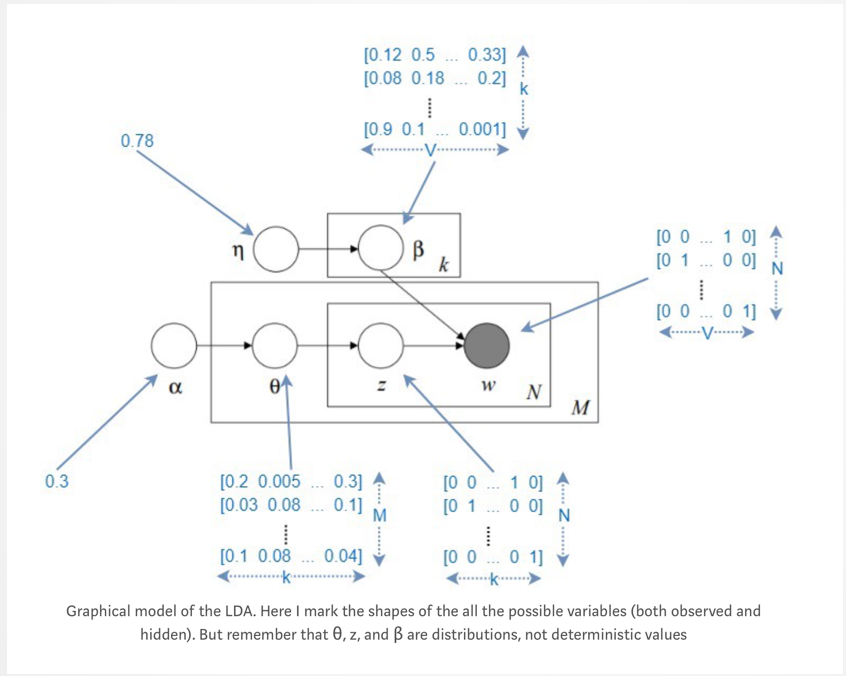

### Coherence
<i><b>Coherence</b></i> provides a quantitative measure of the performance of the model in fitting a specified number of "n" topics.

<i><b>Coherence</b></i> is the measure of the co-occurance of the words within each model topic.  A higher score indicates that words co-occur within topics more, indicating a meaningful and descriptive topic. The alternative measures are described in this research paper: http://svn.aksw.org/papers/2015/WSDM_Topic_Evaluation/public.pdf.

Coherence is used here as a validation measure to determine the ideal number of topics to fit the model to generate tags.  Models are fit for many different values of "n", and the model with the highest coherence score is automatically selected to generate the model tags.

Below, a visualization is given to illustrate how coherence score value changes with a different number of LDA topics.

In [15]:
word_lst = tech_df['Description corpus'].tolist()

id2word = corpora.Dictionary(word_lst)
texts = word_lst
corpus = [id2word.doc2bow(text) for text in texts]

coherence_values = []
model_list = []

start=3; limit=7; step=1;
def AutotuneLDA(start, limit, step, corpus, id2word, coherence_values, model_list):
    for num_topics in range(start, limit, step):
        model=gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=id2word, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    lda_model = model_list[coherence_values.index(max(coherence_values))]
    return lda_model
lda_model = AutotuneLDA(start=start, limit=limit, step=step, corpus=corpus, id2word=id2word, coherence_values=coherence_values, model_list=model_list)

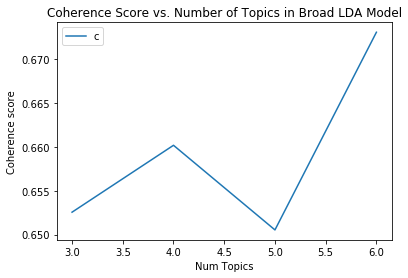

In [16]:
# This cell displays a method of validation on an LDA model to improve the performance of the tagging model.

x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.title('Coherence Score vs. Number of Topics in Broad LDA Model')
plt.show()

In [17]:
doc_lda = lda_model[corpus]
pd.options.display.max_colwidth = 200
pd.DataFrame(lda_model.print_topics()).drop(0,axis=1)

,1
0,"0.004*""remote system"" + 0.004*""operating system"" + 0.004*""lateral movement"" + 0.003*""web server"" + 0.003*""dynamic link libraries dlls"" + 0.002*""remote access"" + 0.002*""control channel"" + 0.002*""us..."
1,"0.004*""operating system"" + 0.003*""remote system"" + 0.003*""user logs"" + 0.003*""privilege escalation"" + 0.003*""registry keys"" + 0.002*""authentication mechanisms"" + 0.002*""other users"" + 0.002*""new s..."
2,"0.004*""os x"" + 0.003*""lateral movement"" + 0.003*""privilege escalation"" + 0.003*""remote systems"" + 0.003*""command line"" + 0.002*""ip mappings"" + 0.002*""system utilities"" + 0.002*""exfiltration over a..."
3,"0.004*""mshta exe"" + 0.004*""remote system"" + 0.003*""malicious code"" + 0.003*""lateral movement"" + 0.002*""launch agents"" + 0.002*""netsh exe"" + 0.002*""valid accounts"" + 0.002*""remote systems"" + 0.002*..."
4,"0.003*""login items"" + 0.003*""user logs"" + 0.003*""malicious code"" + 0.003*""arbitrary code"" + 0.003*""direct access"" + 0.003*""privilege escalation"" + 0.003*""relative pathname"" + 0.003*""import directo..."
5,"0.005*""operating system"" + 0.004*""command line"" + 0.003*""user logs"" + 0.003*""process injection"" + 0.003*""rogue dc"" + 0.002*""os x"" + 0.002*""peripheral devices"" + 0.002*""file system"" + 0.002*""legiti..."


### LDA Topics
The above table shows the most salient words associated with the five topics.  
Because this model will be trained automatically, it will not be useful to attempt to name the topics, or to apply human judgement to decide the best number of topics.  Instead, the coherence score must be used to determine the appropriate number of topics.

In [18]:
topic_words = []
for i in range(coherence_values.index(max(coherence_values))):
    tt = lda_model.get_topic_terms(i,60)
    topic_words.append([id2word[pair[0]] for pair in tt])

tag_list2 = []
for sublist in topic_words:
    for i in sublist:
        tag_list2.append(i)
LDAtags = pd.DataFrame({'Tags': tag_list2})

In [19]:
LDA_tag_assignment = tech_df2.merge(LDAtags, left_on='Description corpus', right_on='Tags', how='inner').drop_duplicates()
LDA_tag_assignment = LDA_tag_assignment.drop(['Description corpus', 'Tactic_name'], axis=1)
LDA_tag_assignment = LDA_tag_assignment.reset_index(drop=True)

pd.DataFrame.from_dict({'Statistic':['# of Unique Techniques Tagged',
                                     'Total # of Tags applied',
                                     'Average # of Tags per Technique',
                                     'Average # of Tags per Tagged Technique',
                                     '# of Tags with >1 Technique'],
                        'Value':[str(LDA_tag_assignment['Technique_number'].nunique()),
                                    str(LDA_tag_assignment['Tags'].count()),
                                    str(round(LDA_tag_assignment['Tags'].count() / 244, 2)),
                                    str(round(LDA_tag_assignment['Tags'].count()/LDA_tag_assignment['Technique_number'].nunique(),2)),
                                str(tag_assignment[tag_assignment.groupby(['Tags'])['Technique_name'].transform('count') > 1]['Tags'].nunique())]}
                      )

,Statistic,Value
0,# of Unique Techniques Tagged,179
1,Total # of Tags applied,476
2,Average # of Tags per Technique,1.95
3,Average # of Tags per Tagged Technique,2.66
4,# of Tags with >1 Technique,169


## Technique-to-Tag Table (LDA Baseline model)

In [20]:
LDA_tag_assignment2 = LDA_tag_assignment.drop(['Technique_description','Corpus length'], axis=1)
LDA_tag_assignment2 = pd.DataFrame(LDA_tag_assignment.groupby(['Technique_number','Technique_name'])['Tags'].apply(list))
LDA_tag_assignment2

,,Tags
Technique_number,Technique_name,
T1003,Credential Dumping,"[credential dumping, operating system, lateral movement, sam file, memory techniques, windows vista, domain controller, lsa secrets, user logs, local system, root privileges, password hashes, brut..."
T1004,Winlogon Helper DLL,"[registry keys, malicious code]"
T1005,Data from Local System,[local system]
T1006,File System Logical Offsets,[direct access]
T1007,System Service Discovery,"[system utilities, other tools]"
T1009,Binary Padding,[security tools]
T1011,Exfiltration Over Other Network Medium,[control channel]
T1012,Query Registry,"[windows registry, significant amount]"
T1013,Port Monitors,[malicious code]


## Tag-to-Technique Table (LDA Baseline model)

In [21]:
LDA_tag_assignment = LDA_tag_assignment.drop(['Technique_description','Corpus length'], axis=1)
pd.DataFrame(LDA_tag_assignment.groupby(['Tags'])['Technique_name'].apply(list))

,Technique_name
Tags,
access controls,"[Valid Accounts, Group Policy Modification]"
access tokens,"[Access Token Manipulation, SID-History Injection]"
accessible web server,"[Web Shell, Redundant Access]"
account lockouts,[Brute Force]
administrator privileges,"[New Service, Bypass User Account Control, Access Token Manipulation, Application Shimming, Launch Agent, Launch Daemon]"
attack traffic,"[Network Denial of Service, Endpoint Denial of Service]"
authentication mechanisms,"[Two-Factor Authentication Interception, Exploitation for Credential Access]"
authentication packages,[Authentication Package]
bits jobs,[BITS Jobs]


## Model 1 description: 
##### Objective: 
- Get the top 5 key words in each cluster achieved by tfidf  encoding method so that techniques in the same cluster (similar techniques) will have the same tags
##### Advantage:
- easy for searching (when one tag is given, the relevant techniques in the cluster it belongs to will pop up)
- All the techniques have at least 5 tags.
##### Disadvantage: 
- low recall. Some of the techniques might be in the wrong cluster. Having the same tags with all the other techniques in the same cluster would cause misunderstanding to users.
#### Procedure:
- Apply K-means algorithm to divide the corpus into clusters based on tf-idf matrix. The number of clusters is determined by trial and error.
- Within each cluster, apply lda topic modelling to generate 12 topics for each cluster and only take the top 5 most important key words in each topic. The number of topics is determined using the coherence score plotted above.
- Now we have 5 different tags for each cluster and all the technique in that cluster have the same tags. Create a dataframe to display the cluster and the corresponding keywords.

## K-Means explained
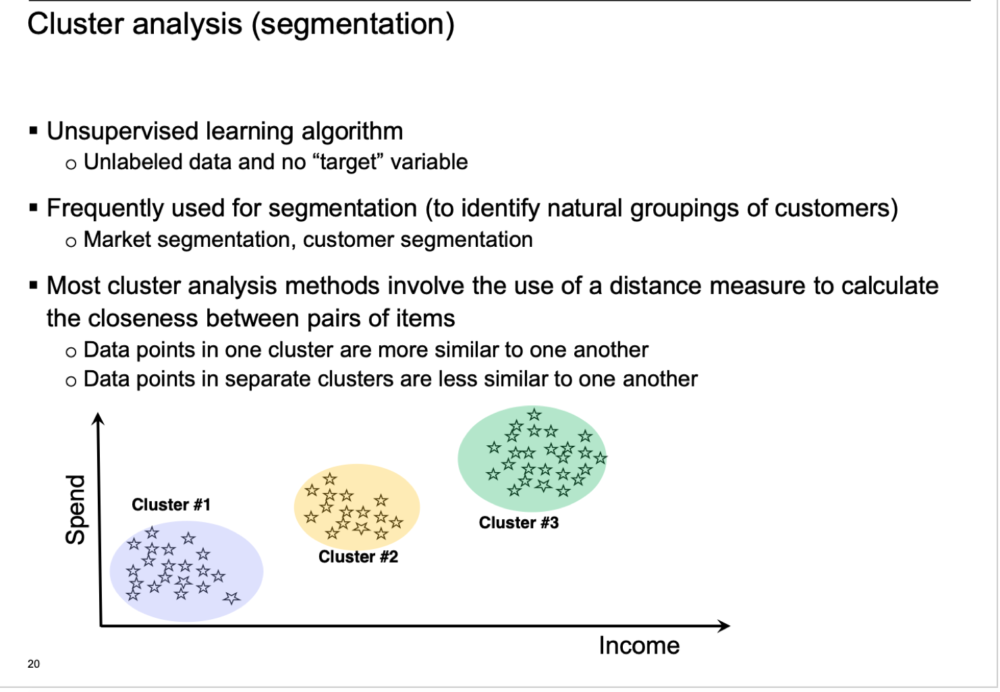
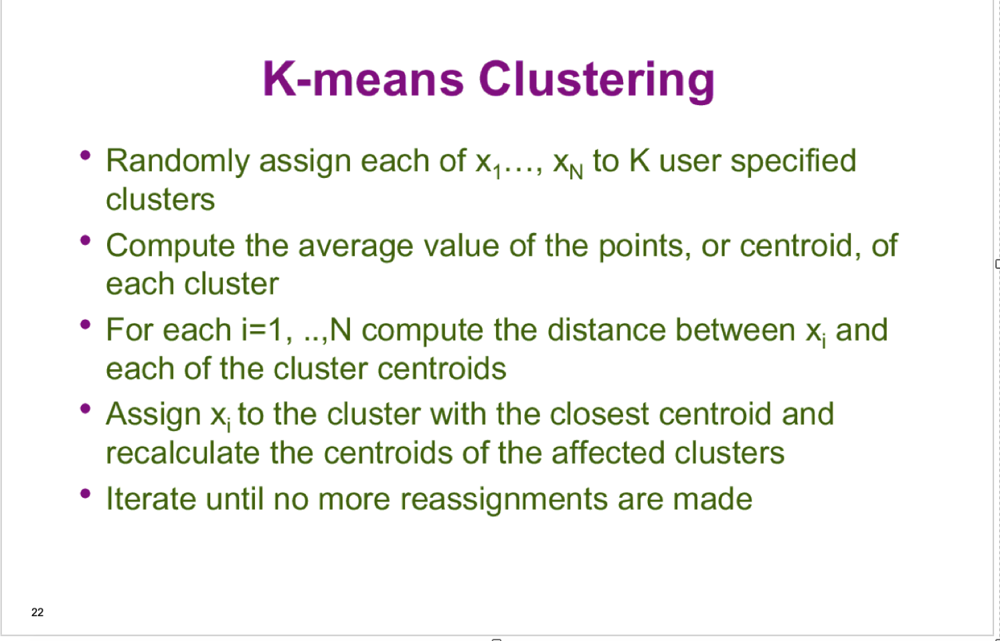
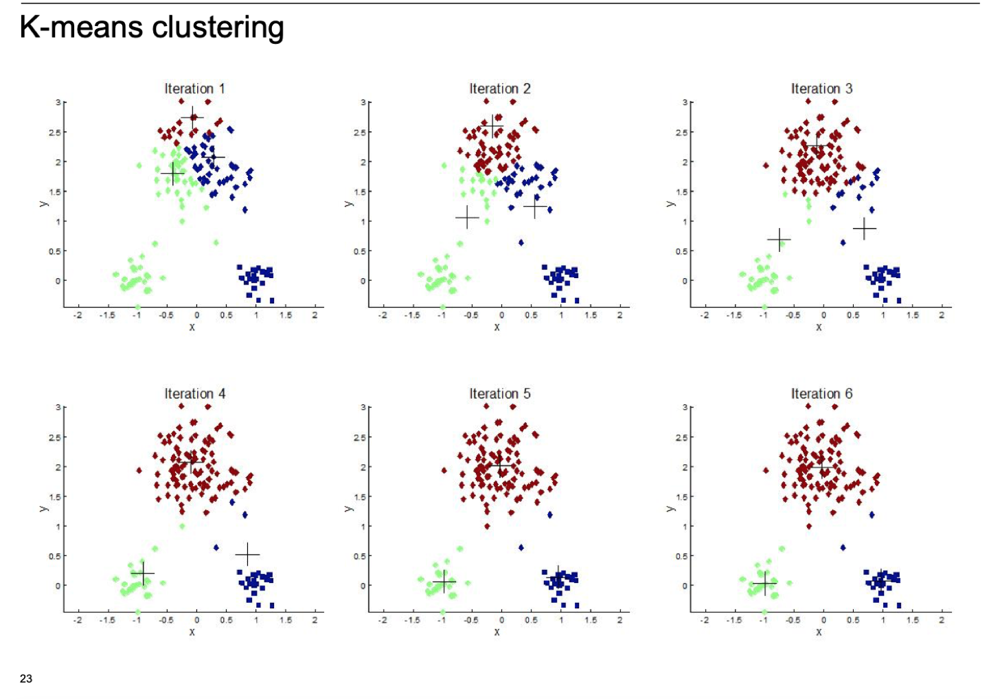

In [22]:
# Function for k-means algorithm. It output the result for the clustering together with the historgram of technique distribution

def kmeans(corpus,k,max_iteration=100,n_initial=5):
    km = KMeans(n_clusters=k, init='k-means++', max_iter=max_iteration, n_init=n_initial,
                verbose=0)
    result=km.fit(corpus)
    return result

In [23]:
km_d2v=kmeans(doc2vec_matrix,12,max_iteration=100,n_initial=5)
km_tfidf=kmeans(tfidf_matrix,12,max_iteration=100,n_initial=5)

In [24]:
#Create the list for pie chart of cluster
def Cluster_list(km):
    cluster_list=[]
    for i in list(set(km.labels_)):
        cluster_list.append(list(km.labels_).count(i))
    return cluster_list

In [25]:
# Shows the distribution of clusters within the corpus

label=list(set(km_tfidf.labels_))
size=Cluster_list(km_tfidf)
trace3 = Pie(
    labels=label,
    values=size,)
data = [trace3]
layout = Layout(
    showlegend=True,
    height=500,
    width=500,
    title='The distribution of techniques in each cluster'
)

fig = dict( data=data, layout=layout )

iplot(fig)

In [26]:
# Create a list that stores all the technique description that belongs to each cluster 
def cluster_content(km,tech_df,column):
    cluster_content_lst=[]
    for i in set(km.labels_):
        cluster_corpus=[tech_df[column].values[x].split(',') for x in np.where(km.labels_ == i)[0]]   
        cluster_content_lst.append(cluster_corpus)
    return cluster_content_lst

def cluster_technique(km,tech_df,column):
    cluster_assignments_lst = []
    for i in set(km.labels_):
        current_cluster_desc = [tech_df['Technique_name'].values[x] for x in np.where(km.labels_ == i)[0]]
        cluster_assignments_lst.append(current_cluster_desc)
    return cluster_assignments_lst

# Create a dataframe that displays the techniques names stored in each cluster and their corresponding description
def cluster_df(km,tech_df,column,cluster_assignment):
    cluster_assignments_lst_df=[]
    cluster_content_lst_df=[]
    cluster_content_df=[]
    for i in set(km.labels_):
        cluster_corpus_df=[tech_df[column].values[x] for x in np.where(km.labels_ == i)[0]]
        cluster_content_df.append(cluster_corpus_df)
    for cluster in cluster_assignment:
        cluster_technique = ', '.join([topic for topic in cluster])
        cluster_assignments_lst_df.append(cluster_technique)
    for content in cluster_content_df:
        cluster_content=','.join([description for description in content])
        cluster_content_lst_df.append(cluster_content)
        cluster_info=pd.DataFrame(cluster_assignments_lst_df)
        cluster_info.columns=['Technique_lst']
        cluster_info['Technique_corpus']=pd.DataFrame(cluster_content_lst_df)
    return cluster_info

In [27]:
cluster_tech_tfidf=cluster_technique(km_tfidf,tech_df,'Word_list')
cluster_info_tfidf=cluster_df(km_tfidf,tech_df,'Word_list',cluster_tech_tfidf)
cluster_content_lst_tfidf=cluster_content(km_tfidf,tech_df,'Word_list')
cluster_tech_d2v=cluster_technique(km_d2v,tech_df,'Word_list')
cluster_info_d2v=cluster_df(km_d2v,tech_df,'Word_list',cluster_tech_d2v)
cluster_content_lst_d2v=cluster_content(km_d2v,tech_df,'Word_list')

In [28]:
from collections import Counter
import operator
k=5
def getTopK(corpus_lst, k):
    lst_dict = Counter(corpus_lst.split(','))
    sorted_lst_dict = sorted(lst_dict.items(), key=operator.itemgetter(1),reverse=True)
    sorted_words=[words[0] for words in sorted_lst_dict[:k]]
    return sorted_words

In [29]:
# Get the top 5 key words in each cluster
def cluster_gettopk(cluster_info,k):
    topk_lst=[]
    for i in range(len(cluster_info.iloc[:,1])):
        topk_cluster=getTopK(cluster_info.iloc[i,1],k)
        topk_lst.append(topk_cluster)
    return topk_lst

def topk_df(topk_cluster_lst,cluster_info):
    topk_lst_df=[]
    for phrase in topk_cluster_lst:
        topk_lst_df.append(','.join(phrase))
    cluster_info['Baseline frequency tags']=pd.DataFrame(topk_lst_df)
    pd.set_option('display.max_colwidth', 200)
    pd.set_option('expand_frame_repr', True)
    return cluster_info

### Save the Model result into dataframe

In [30]:
topk_cluster_tfidf=cluster_gettopk(cluster_info_tfidf,k)
tfidfcluster_df=topk_df(topk_cluster_tfidf,cluster_info_tfidf)
tfidfcluster_df.to_csv('topkWord_tfidf_model_wordlist')
topk_cluster_d2v=cluster_gettopk(cluster_info_d2v,k)
d2vcluster_df=topk_df(topk_cluster_d2v,cluster_info_d2v)
d2vcluster_df.to_csv('topkWord_d2v_model_wordlist')

In [31]:
# The result of the model
tfidfcluster_df


,Technique_lst,Technique_corpus,Baseline frequency tags
0,"Path Interception, Masquerading, Change Default File Association, Process Discovery, Indicator Removal from Tools, Rundll32, Code Signing, Automated Collection, Trusted Developer Utilities, Execut...","path interception occurs,specific path,vulnerable application,bat file,createprocess function,multiple distinct weaknesses,path interception,path environment,variable misconfigurations,search orde...","proxy execution,path environment,arbitrary code,windows utility,search order"
1,"System Service Discovery, System Network Configuration Discovery, Windows Remote Management, Modify Existing Service, New Service, Indicator Blocking, Service Registry Permissions Weakness, Securi...","system utilities,tasklist /svc,likely look,network configuration,information discovery,remote systems,system administration utilities,remote management,windows service,remote system,modify service...","registry keys,windows api,example commands,remote services,sudoers file"
2,"Commonly Used Port, Peripheral Device Discovery, Data from Information Repositories, Execution Guardrails, Stored Data Manipulation, Transmitted Data Manipulation, Runtime Data Manipulation","network detection systems,normal network activity,open ports,different protocol,pivot node,common ports,peripheral devices,computer system,network environment,leverage information repositories,val...","target-specific values,business process,organizational understanding,decision making,complex systems"
3,"Obfuscated Files or Information, Standard Cryptographic Protocol, Software Packing, Scripting, Deobfuscate/Decode Files or Information, Private Keys, Dynamic Data Exchange, Browser Extensions, Pro...","common behavior,different platforms,evade defenses,initial access,mitigate detection,user 's action,deobfuscate/decode files,user execution,plain-text strings,benign files,malicious functionality,...","user execution,evade defenses,social engineering,initial access,office documents"
4,"Winlogon Helper DLL, Query Registry, Port Monitors, Shortcut Modification, Bootkit, DLL Side-Loading, Bypass User Account Control, Process Hollowing, Component Firmware, Regsvr32, Regsvcs/Regasm, ...","windows component,attention sequence,registry entries,hklm\softwaremicrosoft\windows nt\currentversion\winlogon\,hkcu\software\microsoft\windows nt\currentversion\winlogon\,additional helper progr...","malicious code,component object model,com object,windows registry,legitimate program"
5,"Data Compressed, Data from Removable Media, Data Transfer Size Limits, Data from Network Shared Drive, Exfiltration Over Physical Medium, Data Staged, Replication Through Removable Media, Communic...","compress data,sensitive documents,exfiltration channel,custom program,common compression library,sensitive data,removable media,optical disk drive,usb memory,removable media,interactive command sh...","removable media,hard drive,interactive command shells,common functionality,browser bookmarks"
6,"Data from Local System, Accessibility Features, System Firmware, Remote Services, Network Service Scanning, Command-Line Interface, Graphical User Interface, Remote Desktop Protocol, PowerShell, W...","sensitive data,local system sources,file system,file system,command-line interface,file system,local system,windows contains accessibility,key combination,windows logon screen,common accessibility...","file system,command-line interface,remote desktop protocol,system firmware,command-line interfaces"
7,"Data Obfuscation, Fallback Channels, Exfiltration Over Other Network Medium, Automated Exfiltration, Data Encrypted, Custom Cryptographic Protocol, Multiband Communication, Scheduled Transfer, Exf...","hide commands,junk data,protocol traffic,legitimate traffic,c2 communications traffic,non-standard data,message body,http request,alternate communication channels,primary channel,reliable command,...","control channel,direct network floods,attack traffic,exfiltration techniques,altern

In [32]:
Model_1_tags = splitDataFrameList(tfidfcluster_df,'Technique_lst',',')

In [33]:
def remove_duplicates(x):
    return list(dict.fromkeys(x))

In [34]:
tfidf_list_combine=[]
for lst in topk_cluster_tfidf:
    tfidf_list_combine+=lst
tfidf_tag_list=remove_duplicates(tfidf_list_combine)

In [35]:
tfidf_tag_techniques_lst=[]
for tag in tfidf_tag_list:
    tfidf_technique_lst=[]
    for i in range(len(tfidfcluster_df['Technique_lst'].values)):
        if tag in tfidfcluster_df['Baseline frequency tags'].iloc[i].split(','):
            tfidf_technique_lst.append(tfidfcluster_df['Technique_lst'].iloc[i])
    tfidf_tag_techniques_lst.append(tfidf_technique_lst)

In [36]:
def tag_to_technique(technique_lst,tag_list):
    tag_technique_df=[]
    for tags in technique_lst:
        tag_technique_df.append(",".join(tags))
    tag_df=pd.DataFrame(tag_list)
    tag_df.columns=['Tags']
    tag_df['Techniques']=pd.DataFrame(tag_technique_df)
    pd.set_option('display.max_colwidth', 200)
    pd.set_option('expand_frame_repr', True)
    return tag_df

In [37]:
tfidf_taglist=tag_to_technique(tfidf_tag_techniques_lst,tfidf_tag_list)
tfidf_taglist

,Tags,Techniques
0,proxy execution,"Path Interception, Masquerading, Change Default File Association, Process Discovery, Indicator Removal from Tools, Rundll32, Code Signing, Automated Collection, Trusted Developer Utilities, Execut..."
1,path environment,"Path Interception, Masquerading, Change Default File Association, Process Discovery, Indicator Removal from Tools, Rundll32, Code Signing, Automated Collection, Trusted Developer Utilities, Execut..."
2,arbitrary code,"Path Interception, Masquerading, Change Default File Association, Process Discovery, Indicator Removal from Tools, Rundll32, Code Signing, Automated Collection, Trusted Developer Utilities, Execut..."
3,windows utility,"Path Interception, Masquerading, Change Default File Association, Process Discovery, Indicator Removal from Tools, Rundll32, Code Signing, Automated Collection, Trusted Developer Utilities, Execut..."
4,search order,"Path Interception, Masquerading, Change Default File Association, Process Discovery, Indicator Removal from Tools, Rundll32, Code Signing, Automated Collection, Trusted Developer Utilities, Execut..."
5,registry keys,"System Service Discovery, System Network Configuration Discovery, Windows Remote Management, Modify Existing Service, New Service, Indicator Blocking, Service Registry Permissions Weakness, Securi..."
6,windows api,"System Service Discovery, System Network Configuration Discovery, Windows Remote Management, Modify Existing Service, New Service, Indicator Blocking, Service Registry Permissions Weakness, Securi..."
7,example commands,"System Service Discovery, System Network Configuration Discovery, Windows Remote Management, Modify Existing Service, New Service, Indicator Blocking, Service Registry Permissions Weakness, Securi..."
8,remote services,"System Service Discovery, System Network Configuration Discovery, Windows Remote Management, Modify Existing Service, New Service, Indicator Blocking, Service Registry Permissions Weakness, Securi..."
9,sudoers file,"System Service Discovery, System Network Configuration Discovery, Windows Remote Management, Modify Existing Service, New Service, Indicator Blocking, Service Registry Permissions Weakness, Securi..."


In [38]:
# Create a dataframe that shows the number of times that each tag appears
def tag_count_technique(technique_lst,tag_list):
    tag_num=[]
    for tag in technique_lst:
        tag_num.append(len(tag))
    df_tag_summary=pd.DataFrame(tag_list)
    df_tag_summary.columns=['Tag_name']
    df_tag_summary['Num_of_technique']=pd.DataFrame(tag_num)
    return df_tag_summary

In [39]:
tfidf_tag_summary=tag_count_technique(tfidf_tag_techniques_lst,tfidf_tag_list)
tfidf_tag_summary

,Tag_name,Num_of_technique
0,proxy execution,1
1,path environment,1
2,arbitrary code,1
3,windows utility,1
4,search order,1
5,registry keys,1
6,windows api,1
7,example commands,1
8,remote services,1
9,sudoers file,1


## Model 2 description: 
##### Objective: 
- Get specific tags for each technique by leveraging topic modelling
##### Advantage:
- The tags generated for each technique are very specific 
- High recall
##### Disadvantage: 
- Not all of the techniques have tags. There are 11 techniques that don't have any tags.
- The techniques that get the same tags are less than the previous model. Hard for group search.
#### Procedure:
- Apply K-means algorithm to divide the corpus into clusters based on tf-idf matrix. The number of clusters is determined by trial and error.
- Within each cluster, apply lda topic modelling to generate 12 topics for each cluster and only take the top 5 most important key words in each topic. The number of topics is determined using the coherence score plotted above.
- Apply lda across the entire corpus
- Combine the cluster lda topics with the all the corpus lda topics
- Pass the combined master list into each technique description and store the intersected keywords for each technique because the master list can capture the keywords that should've belonged to a specific technique but failed due to misclustering.


### Master list method using tfidf clustering and bow vector space model

In [40]:
# Store the most important keyword in each topic in a list and use this list to be the tags for that cluster
def get_topics(corpus,vsm,num_topic):
    dictionary = Dictionary(corpus)
    lda_model = gensim.models.LdaMulticore(vsm, num_topics=num_topic, id2word=dictionary, passes=2, workers=4)
    return lda_model.print_topics()

def cluster_tags(corpus,vsm,num_topic,topk,pattern):
    cluster_tag_lst=[]
    topic_result=get_topics(corpus,vsm,num_topic)
    for topic in topic_result:
        listsplit=str(topic[1].split('+')).split('*')
        for j in range(1,topk+1):
            keywords_clean=re.search(pattern,listsplit[j]).group()
            cluster_tag_lst.append(keywords_clean)
    return cluster_tag_lst

def remove_duplicates(x):
    return list(dict.fromkeys(x))

In [41]:
# Create the master list that contains all the important topics in each cluster and the corpus
# Convert the format of cluster content so it matches the input form for lda modelling
def Cluster_format(cluster_content_lst):
    cluster_list=[]
    for clusters in cluster_content_lst_d2v:
        description_list=[]
        for description in clusters:
            description_corpus=','.join(description)
            description_list.append(description_corpus)
        cluster_list.append(description_list)
    return cluster_list

# Find the list of topics across the corpus using BOW vsm 
def master_corpus_list(corpus,vsm,num_topic,topk,pattern):
    corpus_split=[doc.split(',') for doc in corpus]
    master_list_corpus=cluster_tags(corpus_split,vsm,num_topic,topk,pattern)
    return master_list_corpus

#Find the list of topics in each cluster using BOW vsm on the data clustered using d2v metric
def master_cluster_list(cluster_content_lst,corpus,num_topic,topk,vsm,cluster_encode,pattern):
    cluster_content_lst_converted=Cluster_format(cluster_content_lst)
    master_list_cluster=[]
    for i in range(len(cluster_content_lst_converted)):
        vsm_cluster=feature.Perform(cluster_content_lst_converted[i],cluster_encode)
        cluster_content_lst_split=[doc.split(',') for doc in cluster_content_lst_converted[i]]
        cluster_tag=cluster_tags(cluster_content_lst_split,vsm_cluster,num_topic,topk,pattern)
        master_list_cluster.append(cluster_tag)
    return master_list_cluster



In [42]:
pattern = r'[a-zA-Z\s]+'
master_list_corpus = master_corpus_list(word_list,feature.Perform(word_list,'bow'),12,5,pattern)
master_list_cluster = master_cluster_list(cluster_content_lst_d2v, word_list,12,5,feature.Perform(word_list,'bow'),'bow',pattern)

In [43]:
#Combine master_list_corpus and master_list_cluster and delete the duplicates to generate the final master list
master_list_raw=list(master_list_corpus)+master_list_cluster
master_list_combine=[]
for lst in master_list_raw:
    master_list_combine+=lst
master_list=remove_duplicates(master_list_combine)

In [44]:
'''
Pass the master list to each technique description and tag the technique
with the keywords in the master list where it matches for d2v clustering method
'''
def TagGeneration(corpus,master_list):
    corpus_split = [doc.split(',') for doc in corpus]
    tag_list=[]
    for technique_description in corpus_split:
        technique_tags=list(set(technique_description).intersection(master_list))
        tag_list.append(technique_tags)
    return tag_list

def list_clean(raw_list):
    clean_list=[]
    for doc in raw_list:
        doc_clean=remove_duplicates(doc)
        clean_list.append(doc_clean)
    return clean_list

def count_empties(lst, is_outer_list=True):
    if lst == []:
        # the outer list does not counted if it's empty
        return 0 if is_outer_list else 1
    elif isinstance(lst, list):
        return sum(count_empties(item, False) for item in lst)
    else:
        return 0

In [45]:
tag_list = TagGeneration(word_list,master_list)

tags = list_clean(tag_list)
    
tags_df = []
for tag in tags:
    tags_df.append(','.join(tag))

In [46]:
empty_technique=count_empties(tags, is_outer_list=True)
print("The number of techniques that do not have any tags:", empty_technique)

The number of techniques that do not have any tags: 19


In [47]:
# Display the result of the model in a dataframe
df_technique=pd.DataFrame(tech_df['Technique_name'].values)
df_technique.columns=['Technique_name']
df_technique['Tags']=pd.DataFrame(tags_df)
pd.options.display.max_rows = 245
df_technique

,Technique_name,Tags
0,Data Obfuscation,http request
1,Data Compressed,"custom program,sensitive documents,compress data"
2,Credential Dumping,"lateral movement,account manipulation,local system,domain controller,password information,password hashes,sensitive information,lsa secrets,group policy preferences,windows vista,sam file,user logs"
3,Winlogon Helper DLL,"registry entries,attention sequence,support winlogon,malicious code,registry keys"
4,Data from Local System,"local system,file system"
5,File System Logical Offsets,"logical volumes,technique bypasses windows file access,file system,direct access,file system data structures"
6,System Service Discovery,system utilities
7,Fallback Channels,
8,Binary Padding,security tools
9,Application Window Discovery,


In [48]:
df_technique.to_csv('masterlist_d2v_bow_model_word')

In [49]:
tag_lst_raw=[]
for tag in tags:
    for phrase in tag:
        tag_lst_raw.append(phrase)
tag_lst=remove_duplicates(tag_lst_raw)

In [50]:
# Outputting statistics 
pd.DataFrame.from_dict({'Statistic':['# of Unique Techniques','Total # of Tags applied','Average # of Tags per Technique'], 
                        'Value':[str(df_technique['Technique_name'].nunique()-empty_technique),
                                 str(len(master_list)),
                                 str(round(len(tag_lst) / df_technique['Technique_name'].nunique(), 2))]}).set_index('Statistic')

,Value
Statistic,
# of Unique Techniques,225
Total # of Tags applied,596
Average # of Tags per Technique,2.13


In [51]:
tag_techniques_lst=[]
for tag in tag_lst:
    technique_lst=[]
    for i in range(len(df_technique['Technique_name'].values)):
        if tag in df_technique['Tags'].iloc[i].split(','):
            technique_lst.append(df_technique['Technique_name'].iloc[i])
    tag_techniques_lst.append(technique_lst)

In [52]:
cluster_tag_technique=tag_to_technique(tag_techniques_lst,tag_lst)

In [53]:
# Create a dataframe that shows the number of times that each tag appears
tag_summary=tag_count_technique(tag_techniques_lst,tag_lst)
tag_summary

,Tag_name,Num_of_technique
0,http request,1
1,custom program,1
2,sensitive documents,2
3,compress data,1
4,lateral movement,14
5,account manipulation,2
6,local system,7
7,domain controller,3
8,password information,2
9,password hashes,2


([<matplotlib.axis.XTick at 0x1a230471d0>,
 <a list of 50 Text xticklabel objects>)

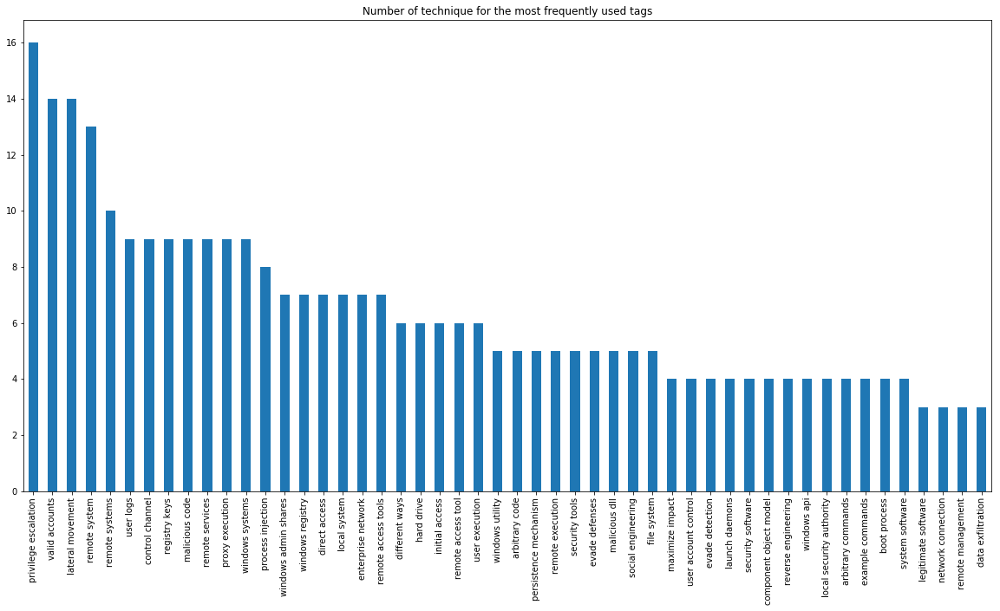

In [54]:
plt.figure(figsize=(20,10))
plt.title('Number of technique for the most frequently used tags')
tag_sort=tag_summary.sort_values(by='Num_of_technique',ascending=0)
tag_top50=tag_sort[:50]
tag_top50['Num_of_technique'].plot.bar(x='Tag names',y='Number of techniques')
plt.xticks(range(len(tag_top50['Tag_name'].values)), tag_top50['Tag_name'], rotation =90)

In [55]:
# Pie chart
label=list(tag_top50['Tag_name'].values)
size=list(tag_top50['Num_of_technique'].values)
trace4 = Pie(
    labels=label,
    values=size,)
data = [trace4]
layout = Layout(
    showlegend=True,
    height=1000,
    width=1000,
    title='The distribution of techniques in each tag'
)

fig = dict( data=data, layout=layout )

iplot(fig)


In [56]:
#To see unique tactic name and the counts 
import collections
print(collections.Counter(tech_df.Tactic_name))

Counter({'DefenseEvasion': 35, 'Persistence': 25, 'Discovery': 20, 'CommandAndControl': 19, 'CredentialAccess': 15, 'DefenseEvasion,Execution': 14, 'Impact': 14, 'Persistence,PrivilegeEscalation': 13, 'Collection': 12, 'LateralMovement': 11, 'Execution': 11, 'Exfiltration': 9, 'InitialAccess': 8, 'DefenseEvasion,Persistence': 6, 'DefenseEvasion,PrivilegeEscalation': 4, 'PrivilegeEscalation': 4, 'Execution,LateralMovement': 3, 'Execution,Persistence': 2, 'LateralMovement,Persistence': 1, 'Persistence,PrivilegeEscalation,DefenseEvasion': 1, 'CredentialAccess,Discovery': 1, 'Execution,Persistence,PrivilegeEscalation': 1, 'Collection,CredentialAccess': 1, 'DefenseEvasion,Persistence,PrivilegeEscalation,InitialAccess': 1, 'LateralMovement,InitialAccess': 1, 'CredentialAccess,Persistence': 1, 'CommandAndControl,DefenseEvasion': 1, 'CommandAndControl,LateralMovement': 1, 'Persistence,InitialAccess': 1, 'DefenseEvasion,Persistence,PrivilegeEscalation': 1, 'DefenseEvasion,Execution,Persistence'

In [57]:
# Compiling tag assignment dataframes into side-by-side comparison table

Final_Tags = tech_df.merge(tag_table, how='left', on='Technique_number').drop(['Technique_description','Tactic_name'],axis=1)
Final_Tags = Final_Tags.merge(LDA_tag_assignment2, how='outer', on='Technique_number', suffixes=('_Baseline','_LDA_Baseline'))
Final_Tags = Final_Tags.merge(df_technique, how='outer', on='Technique_name', suffixes=(' ','_Cluster'))
Final_Tags = Final_Tags.rename(index=str, columns={'Tags':'Tags_Cluster'})
# Final_Tags = Final_Tags.merge(Model_1_tags, how='outer', left_on='Technique_name', right_on='Technique_lst', suffixes=(' ','_Cluster_Baseline')
Final_Tags
# Final_Tags.to_csv('Final Tag Result.csv', index='False')

,Technique_number,Technique_name,Description corpus,Corpus length,Word_list,Phrase_list,Tags_Baseline,Tags_LDA_Baseline,Tags_Cluster
0,T1001,Data Obfuscation,"[c2 communications, hide commands, many methods, junk data, legitimate traffic, c2 communications traffic, non standard data, modified base64, message body, http request]",10,"hide commands,junk data,protocol traffic,legitimate traffic,c2 communications traffic,non-standard data,message body,http request","c2 communications,hide commands,many methods,junk data,legitimate traffic,c2 communications traffic,non standard data,modified base64,message body,http request",[c2 communications],NaN,http request
1,T1002,Data Compressed,"[sensitive documents, exfiltration channel, custom program, common compression library, rar zip]",5,"compress data,sensitive documents,exfiltration channel,custom program,common compression library","sensitive documents,exfiltration channel,custom program,common compression library,rar zip",[sensitive documents],NaN,"custom program,sensitive documents,compress data"
2,T1003,Credential Dumping,"[credential dumping, account login, password information, clear text password, operating system, software credentials, lateral movement, information several, professional security testers addition...",128,"account login,password information,clear text password,lateral movement,professional security testers,additional custom tools,database file,local accounts,net user command,sam database,system leve...","credential dumping,account login,password information,clear text password,operating system,software credentials,lateral movement,information several,professional security testers additional custom...","[credential dumping, operating system, lateral movement, local accounts, a number, sam file, memory techniques, windows vista, domain controller, lsa secrets, ntds file, following tools, sysvol sh...","[credential dumping, operating system, lateral movement, sam file, memory techniques, windows vista, domain controller, lsa secrets, user logs, local system, root privileges, password hashes, brut...","lateral movement,account manipulation,local system,domain controller,password information,password hashes,sensitive information,lsa secrets,group policy preferences,windows vista,sam file,user logs"
3,T1004,Winlogon Helper DLL,"[winlogon exe, windows component, logon logoff, secure attention sequence sas, ctrl alt delete registry entries, hklm softwaremicrosoft windows nt currentversion winlogon, hkcu software microsoft ...",12,"windows component,attention sequence,registry entries,hklm\softwaremicrosoft\windows nt\currentversion\winlogon\,hkcu\software\microsoft\windows nt\currentversion\winlogon\,additional helper progr...","winlogon exe,windows component,logon logoff,secure attention sequence sas,ctrl alt delete registry entries,hklm softwaremicrosoft windows nt currentversion winlogon,hkcu software microsoft windows...","[registry keys, malicious dlls, malicious code]","[registry keys, malicious code]","registry entries,attention sequence,support winlogon,malicious code,registry keys"
4,T1005,Data from Local System,"[sensitive data, local system sources, file system, exfiltration adversaries, file system, command line interface, file system, automated collection, local system]",9,"sensitive data,local system sources,file system,file system,command-line interface,file system,local system","sensitive data,local system sources,file system,exfiltration adversaries,file system,command line interface,file system,automated collection,local system","[local system, sensitive data, file system, exfiltration adversaries, command line interface, automated collection]",[local system],"local system,file system"
5,T1006,File System Logical Offsets,"[direct access, logical volumes programs, direct access, file system data, windows file access controls, file system monitoring tools utilities]",6,"direct access,logical volumes,direct access,file system data structures,technique by

## Creating Tactic Files for Graph based Tag Prediction Model  

In [58]:
#Filtering description based on the tactic name

InitialAccess = tech_df.Technique_description[tech_df.Tactic_name == 'InitialAccess']
Execution = tech_df.Technique_description[tech_df.Tactic_name == 'Execution']
Persistence = tech_df.Technique_description[tech_df.Tactic_name == 'Persistence']
PrivilegeEscalation = tech_df.Technique_description[tech_df.Tactic_name == 'PrivilegeEscalation']
DefenseEvasion = tech_df.Technique_description[tech_df.Tactic_name == 'DefenseEvasion']
CredentialAccess = tech_df.Technique_description[tech_df.Tactic_name == 'CredentialAccess']
Discovery = tech_df.Technique_description[tech_df.Tactic_name == 'Discovery']
LateralMovement = tech_df.Technique_description[tech_df.Tactic_name == 'LateralMovement']
Collection = tech_df.Technique_description[tech_df.Tactic_name == 'Collection']
CommandAndControl = tech_df.Technique_description[tech_df.Tactic_name == 'CommandAndControl']
Exfiltration = tech_df.Technique_description[tech_df.Tactic_name == 'Exfiltration']
Impact = tech_df.Technique_description[tech_df.Tactic_name == 'Impact']


# Using all the description
AllTactic = tech_df.Technique_description

In [59]:
#Creating individual file for each tactic

DefenseEvasion.to_csv('DefenseEvasion.txt', sep=' ', index =False)
Persistence.to_csv('Persistence.txt', sep=' ', index =False)
Discovery.to_csv('Discovery.txt', sep=' ', index =False)
CommandAndControl.to_csv('CommandAndControl.txt', sep=' ', index =False)
Impact.to_csv('Impact.txt', sep=' ', index =False)
Collection.to_csv('Collection.txt', sep=' ', index =False)
Execution.to_csv('Execution.txt', sep=' ', index =False)
Exfiltration.to_csv('Exfiltration.txt', sep=' ', index =False)
InitialAccess.to_csv('InitialAccess.txt', sep=' ', index =False)
PrivilegeEscalation.to_csv('PrivilegeEscalation.txt', sep=' ', index =False)
LateralMovement.to_csv('LateralMovement.txt', sep=' ', index =False)
CredentialAccess.to_csv('CredentialAccess.txt', sep=' ', index =False)

# A single text file contains all the description
AllTactic.to_csv('AllTactic.txt', sep=' ', index =False)

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

The signature of `Series.to_csv` was aligned to that of `DataFram

## Creating Technique Files for Graph based Tag Prediction Model 

In [60]:
import re
tech_list = []
for tech in tech_df.Technique_name: 
   
    tech_list.append(re.sub(r'[^a-zA-Z0-9_\s]+', '', str(tech)))
print(tech_list)

['Data Obfuscation', 'Data Compressed', 'Credential Dumping', 'Winlogon Helper DLL', 'Data from Local System', 'File System Logical Offsets', 'System Service Discovery', 'Fallback Channels', 'Binary Padding', 'Application Window Discovery', 'Exfiltration Over Other Network Medium', 'Query Registry', 'Port Monitors', 'Rootkit', 'Accessibility Features', 'System Network Configuration Discovery', 'Application Deployment Software', 'Remote System Discovery', 'System Firmware', 'Automated Exfiltration', 'Remote Services', 'Data Encrypted', 'Shortcut Modification', 'Custom Cryptographic Protocol', 'Data from Removable Media', 'Multiband Communication', 'Obfuscated Files or Information', 'Windows Remote Management', 'Scheduled Transfer', 'Data Transfer Size Limits', 'Modify Existing Service', 'Standard Cryptographic Protocol', 'System OwnerUser Discovery', 'Path Interception', 'Service Execution', 'Masquerading', 'Logon Scripts', 'DLL Search Order Hijacking', 'Data from Network Shared Drive',

In [61]:
tech_df['modified_tech_name'] = tech_list

for tech_name in tech_df.modified_tech_name:  
    with open(tech_name,'w+') as f:
        for entry in tech_df.Technique_description[tech_df.modified_tech_name == tech_name]:
            f.write(entry)

## Multipartite Graph Model

While researching for Tag prediction, I found an intersting paper called <b>Unsupervised Keyphrase Extraction with Multipartite Graphs</b>. They publised this paper recently <b>April 2018</b> (Its always good try new techniques right!!). Instead of doing the standard approcahes for Tag prediciton like k-means and LDA, I thought why don't we use unsupervised graphs to predict the tags for MITRE website.

Justification for why I chose Graph Model for this Tagging Project:

<b>The graph paradigm goes well beyond databases and application development; it’s a reimagining of what’s possible around the idea of connections. And just like any new problem-solving framework, approaching a challenge from a different dimension often produces an orders-of-magnitude change in possible solutions.</b>

I found a interesting package called <b>pke (Python KeyPhrase Extraction) </b> that has different types of graph models (New package)

How to install it:

pip install git+https://github.com/boudinfl/pke.git

## About Multipartite Graph Model 

<b><h2>Graph</h2> </b>

<b><h3>At its most basic, a graph is a group of dots connected by lines.</h3></b>


That’s the essential picture you need in your head. All the complicated notation you find in computer science textbooks (e.g. G(V, E)) is simply a way to abstract the concept of dots connected by lines.


We use graphs to model relationships in the world. For example:

1. Google Maps uses a series of dots and lines to model the road network and give you directions to your final   destination.
2. Facebook friend networks are a graph where each person is a dot, and the friendships between people are lines.
3. The Internet is a giant graph, where web pages are dots and the links between pages are lines.

We can model objects in physical space, relationships between people, and document structures all using graphs, simple dots and lines!

The upshot is once we have the relationships modeled, we can:

1. Find the shortest path between two points
2. Identify groups of relationships
3. Store data and create links between it in almost any context (think linked lists and trees)

When computer scientists talk about graphs, they don’t use the terms “dots” and “lines.”


Instead, <b>each dot is called a node or a vertex or vertices and each line is called an edge or an arc.</b>


By far, the most common combination of these terms is vertex and edge. When you see someone represent a graph with the notation G(V, E) it literally means “a graph with vertices and edges.”

<b>How Graph based Models work:</b>
   
There are two steps:

1. Building a graph representation of the document(the MITRE descriptions) where vertices are lexical units          (usually words) and edges are semantic relations (associations that there exist between the meanings of words) between them.

2. Ranking nodes or vertices using a graph-theoretic measure , from which the top-ranked ones are used to form       keyphrases (Tags in our project).
        
<b> Differences between Other Graph Models and the MultiPartite Graph Model </b>
        
![title](graph.png)

<b> Advantages of Multipartite Graph </b>

1. Topic diversity while ranking keyphrases (tags)
2. Incorporate intra-topic keypharses (tags) selection which means allows the ranking algorithm to go beyond semantic relatedness by leveraging information from additional salience features.

<b> Key Metrics Used </b>

1. Edge weights: According to the distance between two candidates in the document (the MITRE description) --- the sum of the inverse distances between the candidates or nodes.

2. For Ranking : TextRank Algorithm that was widely used in many areas. We can apply other alogrithms but according to the paper TextRank works consistently well. 

Refer <b> Unsupervised Keyphrase Extraction with Multipartite Graphs </b> paper for more details and formulas used.

https://arxiv.org/pdf/1803.08721v2.pdf

## Model 

In [62]:

def unsupervised_graph_model(filename, no_of_tags):
    # 1. create a MultipartiteRank extractor.
    model = pke.unsupervised.MultipartiteRank()

    # 2. load the content of the document.
    model.load_document(input=filename)

    # 3. select the longest sequences of nouns and adjectives, that do not contain punctuation marks or stopwords as candidates.
    
    pos = {'NOUN'}
    
    #pos = {'NOUN', 'PROPN', 'ADJ'} #We can also try to use this combination, but this combination gives some basic tags like good, first etc 
    
    stoplist = list(string.punctuation)
    stoplist += ['-lrb-', '-rrb-', '-lcb-', '-rcb-', '-lsb-', '-rsb-']
    stoplist += stopwords.words('english')
    model.candidate_selection(pos=pos, stoplist=stoplist)

    # 4. build the Multipartite graph and rank candidates using random walk,
    #    alpha controls the weight adjustment mechanism, see TopicRank for threshold/method parameters.
    model.candidate_weighting(alpha=1.1,
                              threshold=0.74,
                              method='average')

    # 5. get the 10-highest scored candidates as keyphrases or tags
    tags = model.get_n_best(n=no_of_tags)
    
    return tags

Pass any of the tactic file name

    DefenseEvasion.txt
    Persistence.txt
    Discovery.txt
    CommandAndControl.txt
    Impact.txt
    Collection.txt
    Execution.txt
    Exfiltration.txt
    InitialAccess.txt
    PrivilegeEscalation.txt
    LateralMovement.txt
    CredentialAccess.txt
    
You can also pass the whole MITRE description

    AllTactic.txt
    
 

## Top 250 Tags for the full MITRE description

In [63]:
unsupervised_graph_model('AllTactic.txt', 250)

[('adversary', 0.03300940662564451),
 ('system', 0.02572483535075189),
 ('user command', 0.018828134567796723),
 ('file', 0.016958438940858214),
 ('users', 0.015557243693921283),
 ('commands', 0.01079560967741063),
 ('access', 0.010386790044903105),
 ('custom program', 0.009787352785294792),
 ('services', 0.00904394891304086),
 ('information', 0.008357761172516935),
 ('network', 0.008148528489691732),
 ('programs', 0.007940316395136454),
 ('executables', 0.007642326961043734),
 ('code', 0.007583436406541002),
 ('tools', 0.006944691601664871),
 ('process', 0.00673725204011747),
 ('example', 0.006469328986345332),
 ('applications', 0.0063872061571720855),
 ('technique', 0.006383795413665985),
 ('password information', 0.0061893482845881784),
 ('domain controller', 0.006176994643039938),
 ('junk data', 0.005956633000119353),
 ('functions', 0.0058416704035243695),
 ('credentials', 0.0056544308215810985),
 ('operating system', 0.0056175008123892055),
 ('accounts', 0.0051988733099938055),
 (

## Top 50 Tags for Any Tactic

In [64]:
#Here using Inital Access Tactic to get top 50 tags
unsupervised_graph_model('InitialAccess.txt', 50)

[('adversary', 0.02802599985388056),
 ('files', 0.022214465971774594),
 ('email', 0.02212922191358491),
 ('system', 0.021115610836720942),
 ('access', 0.02027093503713944),
 ('spearphishing', 0.020169522678189125),
 ('user', 0.01887786020957994),
 ('services', 0.018017393159779807),
 ('software', 0.016952401780791732),
 ('email attachments', 0.01594321859390751),
 ('forms', 0.015761822194147134),
 ('executables', 0.015564260756802012),
 ('website', 0.013820980802727575),
 ('link', 0.013260225835365546),
 ('target', 0.01300770749761957),
 ('order', 0.012885593461219065),
 ('attachment', 0.012525626622363369),
 ('applications', 0.012501679263289074),
 ('web browser', 0.01239483314802634),
 ('network', 0.011517452474448507),
 ('use', 0.01043919909728525),
 ('enterprise email channels', 0.010350366790777499),
 ('industry', 0.010327651442081745),
 ('engineering', 0.009874411375319291),
 ('supply chain compromise', 0.00985688055598072),
 ('computer system', 0.009006840062645472),
 ('company'

In [65]:
#Pass the appropriate file name and the tactic_name

tag_list = []
five_tags = unsupervised_graph_model('InitialAccess.txt' , 50)

tag_list.append(list(five_tags[n][0] for n in range(0,50)))

tags_for_a_tactic = {'tactic_name': 'InitialAccess', 'tech_tags': tag_list}
    
df_tactic = pd.DataFrame(tags_for_a_tactic, columns= ['tactic_name', 'tech_tags'])


df_tactic

,tactic_name,tech_tags
0,InitialAccess,"[adversary, files, email, system, access, spearphishing, user, services, software, email attachments, forms, executables, website, link, target, order, attachment, applications, web browser, netwo..."


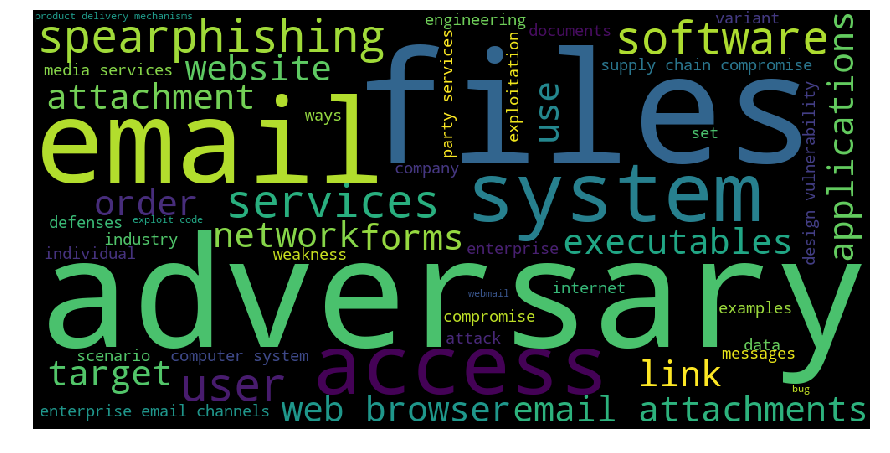

In [66]:
#Word Cloud for the above tactic
flat_list_tactic = []
for sublist_tactic in df_tactic.tech_tags.tolist():
    for i in sublist_tactic:
        flat_list_tactic.append(i)


word_cloud_dict=Counter(flat_list_tactic)
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(word_cloud_dict)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [67]:
#For all tactics plot 50 most frequent tags

tactic_list=['DefenseEvasion.txt',
'Persistence.txt',
'Discovery.txt',
'CommandAndControl.txt',
'Impact.txt',
'Collection.txt',
'Execution.txt',
'Exfiltration.txt',
'InitialAccess.txt',
'PrivilegeEscalation.txt',
'LateralMovement.txt',
'CredentialAccess.txt']

tag_list = []
mitre_tech_list = []


for i in tactic_list:
    five_tags = unsupervised_graph_model(i , 50)
    mitre_tech_list.append(i)
    tag_list.append(list(five_tags[n][0] for n in range(0,50)))
    
tags_all_tactic = {'tactic_name': mitre_tech_list, 'tech_tags': tag_list}
    
df_all_tactic = pd.DataFrame(tags_all_tactic, columns= ['tactic_name', 'tech_tags'])


df_all_tactic

,tactic_name,tech_tags
0,DefenseEvasion.txt,"[adversaries, files, system api, user, file system monitoring tools, system, technique, programs, example, payloads, supply system information, executable, utilities, detection, code, events, comm..."
1,Persistence.txt,"[adversaries, system firmware, users, system, persistence, helper programs, functionalities, files, code, examples, wall clock time, operating system, commands, programs, applications, service con..."
2,Discovery.txt,"[system, information, adversaries, user, system utilities, commands, level groups, file, network, broadcast domain, examples, utilities, listing, domain, groups, services, system time, tools, soft..."
3,CommandAndControl.txt,"[commands, adversaries, protocol traffic, communications, traffic, system, network activity, protocol, proxy, control, domains, junk data, connections, hosts, port, networks, stages, tools, algori..."
4,Impact.txt,"[systems, adversaries, data, services, network, network resources, files, order, attack techniques, traffic, availability, attacks, resources, dos, impact, volume shadow copies, contents, botnets,..."
5,Collection.txt,"[adversaries, information, file system, data, system sources, user email, webmail applications, files, browser, user, applications, system, functionality, techniques, command shells, computers, ne..."
6,Execution.txt,"[command, adversaries, system components, execution, files, line interfaces, systems, access, functions, users, exploitation, application manifest, code, services, software, data links, applicatio..."
7,Exfiltration.txt,"[exfiltration, data, network, command, channel, control channel, protocol, information, internet connection, file transfer protocol, network medium, connection, custom program, adversary, algorith..."
8,InitialAccess.txt,"[adversary, files, email, system, access, spearphishing, user, services, software, email attachments, forms, executables, website, link, target, order, attachment, applications, web browser, netwo..."
9,PrivilegeEscalation.txt,"[users, adversary, access, system, sudo, commands, privilege escalation methods, password, software vulnerability, security, sudoers file, groups, permissions, permission levels, sid, exploitation..."


In [68]:
'''
flat_list = []
for sublist in df_all_tactic.tech_tags.tolist():
    for i in sublist:
        flat_list.append(i)

phrase = []
phrase_freq = []
for i in Counter(flat_list).most_common(50):
    phrase.append(i[0])
    phrase_freq.append(i[1])

trace3 = Bar(
    x=phrase,
    y=phrase_freq,
    marker=dict(
       color='#000080',
    ),
    opacity=0.75
)
data = [trace3]
layout = Layout(
    showlegend=True,
    height=600,
    width=1200,
    title='50 Most Frequent Tags considered All Tactics',
    xaxis={'title':'Tags', 'automargin':True},
    yaxis={'title':'Frequency'}
)

fig = dict( data=data, layout=layout )

iplot(fig)
'''

"\nflat_list = []\nfor sublist in df_all_tactic.tech_tags.tolist():\n    for i in sublist:\n        flat_list.append(i)\n\nphrase = []\nphrase_freq = []\nfor i in Counter(flat_list).most_common(50):\n    phrase.append(i[0])\n    phrase_freq.append(i[1])\n\ntrace3 = Bar(\n    x=phrase,\n    y=phrase_freq,\n    marker=dict(\n       color='#000080',\n    ),\n    opacity=0.75\n)\ndata = [trace3]\nlayout = Layout(\n    showlegend=True,\n    height=600,\n    width=1200,\n    title='50 Most Frequent Tags considered All Tactics',\n    xaxis={'title':'Tags', 'automargin':True},\n    yaxis={'title':'Frequency'}\n)\n\nfig = dict( data=data, layout=layout )\n\niplot(fig)\n"

## Top 5 Tags for any Technique 

In [69]:
#Pass any Technique from tech_list
unsupervised_graph_model('System OwnerUser Discovery', 5)

[('user', 0.1579775509089212),
 ('system', 0.12765411449206418),
 ('account usernames', 0.08970005796189527),
 ('process ownership', 0.08927878280958887),
 ('information', 0.08574030121435987)]

In [70]:
#Dataframe: For each technique --> Top 5 Tags
tag_list = []
mitre_tech_list = []


for i in tech_list:
    five_tags = unsupervised_graph_model(i , 5)
    mitre_tech_list.append(i)
    tag_list.append(list(five_tags[n][0] for n in range(0,5)))
    
tags = {'technique': mitre_tech_list, 'tags': tag_list}
    
technique_df = pd.DataFrame(tags, columns= ['technique', 'tags'])


technique_df

,technique,tags
0,Data Obfuscation,"[communications, protocol traffic, junk data, steganography, decipher]"
1,Data Compressed,"[data, exfiltration, compression, order, network]"
2,Credential Dumping,"[account login, credentials, tools, hash, password information]"
3,Winlogon Helper DLL,"[logon, adversaries, actions, advantage, abuse]"
4,Data from Local System,"[file system, information, system sources, adversaries, databases]"
5,File System Logical Offsets,"[access, programs, file system data structures, volumes, drive]"
6,System Service Discovery,"[services, information, adversaries, commands, net]"
7,Fallback Channels,"[communication channels, fallback, command, control, order]"
8,Binary Padding,"[files, security tools, data, size, adversaries]"
9,Application Window Discovery,"[information, listing, application windows, context, window listings]"


In [71]:
# To see the tags for each technique
list(technique_df.tags[technique_df.technique=='Commonly Used Port'])

[['port', 'node', 'protocol', 'firewalls', 'network detection systems']]

In [72]:
'''
#Plot 50 Most Frequent Tags considered all techniques
flat_list = []
for sublist in technique_df.tags.tolist():
    for i in sublist:
        flat_list.append(i)

phrase = []
phrase_freq = []
for i in Counter(flat_list).most_common(50):
    phrase.append(i[0])
    phrase_freq.append(i[1])

trace3 = Bar(
    x=phrase,
    y=phrase_freq,
    marker=dict(
       color='#228B22',
    ),
    opacity=0.75
)
data = [trace3]
layout = Layout(
    showlegend=True,
    height=600,
    width=1200,
    title='50 Most Frequent Tags considered All Techniques',
    xaxis={'title':'Tags', 'automargin':True},
    yaxis={'title':'Frequency'}
)

fig = dict( data=data, layout=layout )

iplot(fig)
'''

"\n#Plot 50 Most Frequent Tags considered all techniques\nflat_list = []\nfor sublist in technique_df.tags.tolist():\n    for i in sublist:\n        flat_list.append(i)\n\nphrase = []\nphrase_freq = []\nfor i in Counter(flat_list).most_common(50):\n    phrase.append(i[0])\n    phrase_freq.append(i[1])\n\ntrace3 = Bar(\n    x=phrase,\n    y=phrase_freq,\n    marker=dict(\n       color='#228B22',\n    ),\n    opacity=0.75\n)\ndata = [trace3]\nlayout = Layout(\n    showlegend=True,\n    height=600,\n    width=1200,\n    title='50 Most Frequent Tags considered All Techniques',\n    xaxis={'title':'Tags', 'automargin':True},\n    yaxis={'title':'Frequency'}\n)\n\nfig = dict( data=data, layout=layout )\n\niplot(fig)\n"

## Techniques for each Tag

In [73]:
def remove_duplicates(x):
    return list(dict.fromkeys(x))

In [74]:
tag_lst_raw=[]
for tag in technique_df.tags:
    for phrase in tag:
        tag_lst_raw.append(phrase)
tag_lst=remove_duplicates(tag_lst_raw)

In [75]:
tag_techniques_lst=[]
for tag in tag_lst:
    technique_lst=[]
    for i in range(len(technique_df.technique.values)):
        if tag in technique_df.tags.iloc[i]:
            technique_lst.append(technique_df.technique.iloc[i])
    tag_techniques_lst.append(technique_lst)

In [76]:
#DataFrame for Each Tag ---> Associated Techniques
final_tags = {'tags': tag_lst, 'technique': tag_techniques_lst}
tag_df = pd.DataFrame(final_tags, columns= ['tags', 'technique'])
tag_df

,tags,technique
0,communications,"[Data Obfuscation, Multiband Communication]"
1,protocol traffic,[Data Obfuscation]
2,junk data,[Data Obfuscation]
3,steganography,[Data Obfuscation]
4,decipher,[Data Obfuscation]
5,data,"[Data Compressed, Binary Padding, Multiband Communication, Data Transfer Size Limits, Network Sniffing, Data Staged, Custom Command and Control Protocol, NTFS File Attributes, Clipboard Data, Data..."
6,exfiltration,"[Data Compressed, Exfiltration Over Other Network Medium, Automated Exfiltration, Data Encrypted, Exfiltration Over Physical Medium]"
7,compression,[Data Compressed]
8,order,"[Data Compressed, Fallback Channels, User Execution, Stored Data Manipulation, Transmitted Data Manipulation, Runtime Data Manipulation, Firmware Corruption, Resource Hijacking]"
9,network,"[Data Compressed, Application Deployment Software, System Network Connections Discovery, Process Discovery, Redundant Access, Trusted Relationship, Data Destruction, Data Encrypted for Impact, Dis..."


In [79]:
# To see the technique for each tags
list(tag_df.technique[tag_df.tags=='exfiltration'])

[['Data Compressed',
  'Exfiltration Over Other Network Medium',
  'Automated Exfiltration',
  'Data Encrypted',
  'Exfiltration Over Physical Medium']]

In [78]:
'''
#Plot 50 Most Frequent Techniques considered All Tags
flat_list = []
for sublist in tag_df.technique.tolist():
    for i in sublist:
        flat_list.append(i)

phrase = []
phrase_freq = []
for i in Counter(flat_list).most_common(50):
    phrase.append(i[0])
    phrase_freq.append(i[1])

trace3 = Bar(
    x=phrase,
    y=phrase_freq,
    marker=dict(
       color='#FF0000',
    ),
    opacity=0.75
)
data = [trace3]
layout = Layout(
    showlegend=True,
    height=600,
    width=1200,
    title='50 Most Frequent Techniques considered All Tags',
    xaxis={'title':'Technique', 'automargin':True},
    yaxis={'title':'Frequency'}
)

fig = dict( data=data, layout=layout )

iplot(fig)

'''

"\n#Plot 50 Most Frequent Techniques considered All Tags\nflat_list = []\nfor sublist in tag_df.technique.tolist():\n    for i in sublist:\n        flat_list.append(i)\n\nphrase = []\nphrase_freq = []\nfor i in Counter(flat_list).most_common(50):\n    phrase.append(i[0])\n    phrase_freq.append(i[1])\n\ntrace3 = Bar(\n    x=phrase,\n    y=phrase_freq,\n    marker=dict(\n       color='#FF0000',\n    ),\n    opacity=0.75\n)\ndata = [trace3]\nlayout = Layout(\n    showlegend=True,\n    height=600,\n    width=1200,\n    title='50 Most Frequent Techniques considered All Tags',\n    xaxis={'title':'Technique', 'automargin':True},\n    yaxis={'title':'Frequency'}\n)\n\nfig = dict( data=data, layout=layout )\n\niplot(fig)\n\n"